In [1]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [2]:
!pip install segmentation_models_pytorch

In [3]:
pip install rasterio

In [4]:
import os
import cv2
import numpy as np
import rasterio
import glob
import tensorflow as tf
from PIL import Image
import matplotlib.pyplot as plt
import random
import torch

In [5]:
dataset_path_rgn = "drive/MyDrive/Image-results-tiff-of-ragunan"
number_to_load_rgn = ['417708', '417709', '417710', '417711', '417712', '417713', '417714', '417715', '417716', '417717', '417718', '417719']

images_paths = []
masks_paths = []

images_dir = os.path.join(dataset_path_rgn, 'image')
masks_dir = os.path.join(dataset_path_rgn, 'mask')

for numb_name in number_to_load_rgn:
    images_dir = os.path.join(dataset_path_rgn, 'image', numb_name)
    masks_dir = os.path.join(dataset_path_rgn, 'mask', numb_name)
    if os.path.isdir(images_dir) and os.path.isdir(masks_dir):
        image_path = sorted([os.path.join(images_dir, f) for f in os.listdir(images_dir) if f.endswith('.tif')])
        mask_path = sorted([os.path.join(masks_dir, f) for f in os.listdir(masks_dir) if f.endswith('.tif')])

        images_paths.extend(image_path)
        masks_paths.extend(mask_path)

In [6]:
from sklearn.model_selection import train_test_split

image_train, image_test, mask_train, mask_test = train_test_split(
    images_paths, masks_paths, test_size = 0.2, random_state = 84
)

image_test, image_val, mask_test, mask_val = train_test_split(
    image_test, mask_test, test_size = 0.5, random_state = 84
)

In [7]:
from torch.utils.data import Dataset, DataLoader
import albumentations as A
from albumentations.pytorch import ToTensorV2

train_transform = A.Compose([
    A.HorizontalFlip(p = 0.5),
    A.VerticalFlip(p = 0.5),
    A.RandomRotate90(p = 0.5),
    A.RandomBrightnessContrast(p = 0.5),
    A.MedianBlur(blur_limit = 5, p = 0.5),
    A.GaussNoise(std_range = (0.01, 0.05), p = 0.5),
    A.Normalize(mean = (0.485, 0.456, 0.406), std = (0.229, 0.224, 0.225)),
    ToTensorV2()
])

test_transform = A.Compose([
    A.Normalize(mean = (0.485, 0.456, 0.406), std = (0.229, 0.224, 0.225)),
    ToTensorV2()
])

val_transform = A.Compose([
    A.Normalize(mean = (0.485, 0.456, 0.406), std = (0.229, 0.224, 0.225)),
    ToTensorV2()
])

class SegmentDataset(Dataset):
    def __init__(self, image_paths, mask_paths, transform = None):
        self.image_paths = image_paths
        self.mask_paths = mask_paths
        self.transform = transform

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        image_path = self.image_paths[idx]
        mask_path = self.mask_paths[idx]

        image = np.array(Image.open(image_path).convert("RGB"))
        mask = np.array(Image.open(mask_path).convert("L"))

        mask = (mask > 0).astype(np.uint8)

        if self.transform:
            augmented = self.transform(image = image, mask = mask)
            image, mask = augmented["image"], augmented["mask"]

        return image, mask, image_path, mask_path

In [8]:
train_dataset = SegmentDataset(image_train, mask_train, transform = train_transform)
train_loader = DataLoader(train_dataset, batch_size = 8, pin_memory = False, shuffle = True, num_workers = 8)

test_dataset = SegmentDataset(image_test, mask_test, transform = test_transform)
test_loader = DataLoader(test_dataset, batch_size = 8, pin_memory = False, shuffle = False, num_workers = 8)

val_dataset = SegmentDataset(image_val, mask_val, transform = val_transform)
val_loader = DataLoader(val_dataset, batch_size = 8, pin_memory = False, shuffle = False, num_workers = 8)

/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:627: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


In [9]:
train_size = len(train_dataset)
val_size = len(val_dataset)
test_size = len(test_dataset)

print(f"Train size: {train_size}")
print(f"Validation size: {val_size}")
print(f"Test size: {test_size}")

Train size: 144
Validation size: 18
Test size: 18


In [10]:
image_train, mask_train, img_path_train, mask_path_train = train_dataset[0]
print(image_train)
print(image_train.shape)

tensor([[[-0.6281, -0.6109, -0.5596,  ..., -1.6042, -1.5357, -1.8782],
         [-0.5938, -0.5938, -0.5767,  ..., -1.6384, -1.6898, -1.5699],
         [-0.5424, -0.5596, -0.5938,  ..., -1.7412, -1.9295, -1.4329],
         ...,
         [-0.4226, -0.0801, -0.4054,  ..., -1.4500, -1.2103, -1.1075],
         [ 0.3309,  0.3138, -0.0287,  ..., -1.3987, -1.3644, -1.2788],
         [ 0.1254,  0.0398, -0.0629,  ..., -1.7412, -1.8610, -1.7583]],

        [[-0.7752, -0.7577, -0.7577,  ..., -1.2304, -1.1604, -1.5105],
         [-0.7402, -0.7402, -0.7752,  ..., -1.2654, -1.3179, -1.1954],
         [-0.7402, -0.7577, -0.7927,  ..., -1.3704, -1.5630, -1.0553],
         ...,
         [-0.2675,  0.0826, -0.2500,  ..., -1.1253, -0.8803, -0.7752],
         [ 0.5028,  0.4853,  0.1352,  ..., -1.0728, -1.0378, -0.9503],
         [ 0.2927,  0.2052,  0.1001,  ..., -1.4230, -1.5455, -1.4405]],

        [[-0.6367, -0.6193, -0.6018,  ..., -1.1944, -1.1247, -1.4733],
         [-0.6018, -0.6018, -0.6193,  ..., -1

In [11]:
print(mask_train)
print(mask_train.shape)

tensor([[0, 0, 0,  ..., 1, 1, 1],
        [0, 0, 0,  ..., 1, 1, 1],
        [0, 0, 0,  ..., 1, 1, 1],
        ...,
        [0, 0, 0,  ..., 1, 1, 1],
        [0, 0, 0,  ..., 1, 1, 1],
        [0, 0, 0,  ..., 0, 0, 0]], dtype=torch.uint8)
torch.Size([256, 256])


In [12]:
image_test, mask_test, img_path_test, mask_path_test = test_dataset[0]
print(image_test)
print(image_test.shape)

tensor([[[-1.3473, -1.4500, -1.4672,  ..., -0.5596, -0.2856, -1.2788],
         [-1.0390, -1.1418, -1.2103,  ..., -0.8507, -0.9192, -1.4158],
         [-0.9192, -0.9877, -1.0733,  ..., -1.5014, -1.3815, -1.0562],
         ...,
         [ 0.8789,  0.8961,  0.9303,  ..., -0.9363, -0.9705, -1.5699],
         [ 0.8789,  0.8961,  0.9132,  ..., -1.6384, -1.6555, -1.5185],
         [ 0.8618,  0.8789,  0.8961,  ..., -1.7412, -1.9809, -1.6555]],

        [[-1.1954, -1.3004, -1.3179,  ..., -0.4076, -0.0924, -1.1078],
         [-0.8803, -0.9853, -1.0553,  ..., -0.6527, -0.7402, -1.2129],
         [-0.7402, -0.8102, -0.8978,  ..., -1.3004, -1.1779, -0.7927],
         ...,
         [ 1.0280,  1.0455,  1.0805,  ..., -0.6877, -0.7227, -1.3354],
         [ 1.0280,  1.0455,  1.0630,  ..., -1.4055, -1.4405, -1.3004],
         [ 1.0105,  1.0280,  1.0455,  ..., -1.5105, -1.7731, -1.4405]],

        [[-1.1596, -1.2641, -1.2816,  ..., -0.2358,  0.1128, -0.8981],
         [-0.8458, -0.9504, -1.0201,  ..., -0

In [13]:
print(mask_test)
print(mask_test.shape)

tensor([[1, 1, 1,  ..., 0, 0, 0],
        [1, 1, 1,  ..., 0, 0, 0],
        [1, 1, 1,  ..., 0, 0, 0],
        ...,
        [0, 0, 0,  ..., 0, 0, 0],
        [0, 0, 0,  ..., 0, 0, 0],
        [0, 0, 0,  ..., 0, 0, 0]], dtype=torch.uint8)
torch.Size([256, 256])


In [14]:
image_val, mask_val, img_path_val, mask_path_val = val_dataset[0]
print(image_val)
print(image_val.shape)

tensor([[[-0.8507, -1.0390, -1.1247,  ..., -1.4672, -1.2788, -1.2617],
         [-1.0733, -0.9192, -1.3130,  ..., -1.5014, -1.4500, -1.5357],
         [-1.0390, -0.6965, -1.1589,  ..., -1.3473, -1.3987, -1.5014],
         ...,
         [-1.3644, -1.3473, -1.3644,  ..., -0.9705, -0.6965, -0.9363],
         [-1.3987, -1.3644, -1.3644,  ..., -0.5253, -0.6452, -0.7993],
         [-1.4158, -1.3815, -1.3644,  ..., -0.9534, -0.6281, -0.5767]],

        [[-0.5126, -0.7052, -0.8102,  ..., -1.0028, -0.8102, -0.7927],
         [-0.7402, -0.5826, -1.0028,  ..., -1.0378, -0.9853, -1.0728],
         [-0.7052, -0.3550, -0.8277,  ..., -0.8803, -0.9328, -1.0378],
         ...,
         [-0.9153, -0.8978, -0.9153,  ..., -0.5301, -0.3375, -0.5826],
         [-0.9503, -0.9153, -0.9153,  ..., -0.0749, -0.2850, -0.4426],
         [-0.9678, -0.9328, -0.9153,  ..., -0.5126, -0.2675, -0.2150]],

        [[-0.4624, -0.6541, -0.7936,  ..., -0.8981, -0.7064, -0.6890],
         [-0.6890, -0.5321, -0.9853,  ..., -0

In [15]:
print(mask_val)
print(mask_val.shape)

tensor([[0, 1, 1,  ..., 1, 1, 1],
        [1, 1, 1,  ..., 1, 1, 1],
        [1, 0, 1,  ..., 1, 1, 1],
        ...,
        [1, 1, 1,  ..., 1, 1, 1],
        [1, 1, 1,  ..., 1, 1, 1],
        [1, 1, 1,  ..., 1, 1, 1]], dtype=torch.uint8)
torch.Size([256, 256])


In [16]:
for i, (image, mask, img_path, mask_path) in enumerate(train_dataset):
    if mask.sum() == 0:
        print(f"Empty mask found at index {i}")

Empty mask found at index 38


In [17]:
for i, (image, mask, img_path, mask_path) in enumerate(test_dataset):
    if mask.sum() == 0:
        print(f"Empty mask found at index {i}")

In [18]:
for i, (image, mask, img_path, mask_path) in enumerate(val_dataset):
    if mask.sum() == 0:
        print(f"Empty mask found at index {i}")

In [19]:
for img_path, mask_path in zip(images_paths[:5], masks_paths[:5]):
    print(f"Image: {os.path.basename(img_path)} - Mask: {os.path.basename(mask_path)}")

Image: 271333.tif - Mask: 271333_mask.tif
Image: 271334.tif - Mask: 271334_mask.tif
Image: 271335.tif - Mask: 271335_mask.tif
Image: 271336.tif - Mask: 271336_mask.tif
Image: 271337.tif - Mask: 271337_mask.tif


In [20]:
for image, mask, img_path, mask_path in train_loader:
    print("image shape:", image.shape)
    print("mask shape:", mask.shape)

image shape: torch.Size([8, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([8, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([8, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([8, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([8, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([8, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([8, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([8, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([8, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([8, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([8, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([8, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([8, 3, 256, 256]

In [21]:
for image, mask, img_path, mask_path in test_loader:
    print("image shape:", image.shape)
    print("mask shape:", mask.shape)

image shape: torch.Size([8, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([8, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([2, 3, 256, 256])
mask shape: torch.Size([2, 256, 256])


In [22]:
for img, mask, img_path, mask_path in val_loader:
    print("image shape:", image.shape)
    print("mask shape:", mask.shape)

image shape: torch.Size([2, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([2, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([2, 3, 256, 256])
mask shape: torch.Size([2, 256, 256])


In [23]:
import segmentation_models_pytorch as smp
import torch.nn as nn
import torch.nn.functional as F

class ChannelSELayer(nn.Module):
    def __init__(self, num_channels, reduction_ratio = 16):
        super(ChannelSELayer, self).__init__()
        num_channels_reduced = max(1, num_channels // reduction_ratio)
        self.fc1 = nn.Linear(num_channels, num_channels_reduced, bias = True)
        self.fc2 = nn.Linear(num_channels_reduced, num_channels, bias = True)
        self.relu = nn.ReLU()
        self.sigmoid = nn.Sigmoid()

    def forward(self, input_tensor):
        batch_size, num_channels, H, W = input_tensor.size()

        squeeze_tensor = input_tensor.view(batch_size, num_channels, -1).mean(dim = 2)

        fc_out_1 = self.relu(self.fc1(squeeze_tensor))
        fc_out_2 = self.sigmoid(self.fc2(fc_out_1))

        return input_tensor * fc_out_2.view(batch_size, num_channels, 1, 1)

class CustomDeepLabV3Plus(nn.Module):
    def __init__(self, encoder_name = "resnet101", encoder_weights = "imagenet", in_channels = 3, classes = 1):
        super(CustomDeepLabV3Plus, self).__init__()
        self.base_model = smp.DeepLabV3Plus(
            encoder_name = encoder_name,
            encoder_weights = encoder_weights,
            in_channels = in_channels,
            classes = 256,
            activation = None
        )

        self.head = nn.Sequential(
            nn.Conv2d(256, 128, 3, padding = 1),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace = True),
            ChannelSELayer(128),
            nn.Dropout2d(0.5),
            nn.Conv2d(128, 64, 3, padding = 1),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace = True),
            ChannelSELayer(64),
            nn.Dropout2d(0.5),
            nn.Conv2d(64, classes, 1)
        )

    def forward(self, x):
        x = self.base_model(x)
        x = self.head(x)
        return x

def batchnorm_to_groupnorm(model, num_groups = 32):
    for name, module in model.named_children():
        if isinstance(module, nn.BatchNorm2d):
            num_features = module.num_features
            valid_num_groups = min(num_groups, num_features)
            while num_features % valid_num_groups != 0 and valid_num_groups > 1:
                valid_num_groups -= 1
            setattr(model, name, nn.GroupNorm(num_groups = valid_num_groups, num_channels = num_features))
        else:
            batchnorm_to_groupnorm(module, num_groups)
    return model

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

deeplab_model = CustomDeepLabV3Plus(
    encoder_name = "resnet101",
    encoder_weights = "imagenet",
    in_channels = 3,
    classes = 1
)

deeplab_model = batchnorm_to_groupnorm(deeplab_model)
deeplab_model.to(device)

/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


CustomDeepLabV3Plus(
  (base_model): DeepLabV3Plus(
    (encoder): ResNetEncoder(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): GroupNorm(32, 64, eps=1e-05, affine=True)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): GroupNorm(32, 64, eps=1e-05, affine=True)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): GroupNorm(32, 64, eps=1e-05, affine=True)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): GroupNorm(32, 256, eps=1e-05, affine=True)
          (relu): ReLU(inplace=True)
          (downsample): Sequential(
            (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
  

In [24]:
def calc_iou(pred, gt):
    with torch.no_grad():
        pred = (pred.sigmoid() > 0.5).long()
        pred, gt = pred.contiguous().view(-1), gt.contiguous().view(-1)

        if gt.sum() == 0:
          if pred.sum() == 0:
            return 1.0
          else:
            return 0.0

        intersect = torch.logical_and(pred > 0, gt > 0).sum().float().item()
        union = torch.logical_or(pred > 0, gt > 0).sum().float().item()

        iou = (intersect + 1e-6) / (union + 1e-6)

    return iou

In [25]:
class DiceFocalLoss(nn.Module):
    def __init__(self, dice_weight, focal_weight, alpha = 0.25, gamma = 2.0):
        super(DiceFocalLoss, self).__init__()
        self.alpha = alpha
        self.gamma = gamma
        self.dice_weight = dice_weight
        self.focal_weight = focal_weight

    def forward(self, inputs, targets, smooth = 1e-6):
        inputs = torch.sigmoid(inputs)

        inputs = inputs.view(-1)
        targets = targets.view(-1)

        intersection = (inputs * targets).sum()
        dice_loss = 1 - (2.0 * intersection + smooth) / (inputs.sum() + targets.sum() + smooth)

        bce = F.binary_cross_entropy(inputs, targets, reduction = 'none')
        pt = torch.exp(-bce)
        focal_loss = (self.alpha * (1 - pt) ** self.gamma * bce).mean()

        loss = self.dice_weight * dice_loss + self.focal_weight * focal_loss
        return loss

In [26]:
!pip install optuna

In [27]:
import torch.optim as optim
from tqdm import tqdm
import optuna
import warnings
from torch.optim.lr_scheduler import ReduceLROnPlateau, StepLR, CosineAnnealingLR

device = "cuda" if torch.cuda.is_available() else "cpu"

warnings.filterwarnings("ignore")

def train_model(model, train_loader, val_loader, device, scheduler_type, dice_weight, focal_weight):
    loss_func = DiceFocalLoss(dice_weight = dice_weight, focal_weight = focal_weight)
    optimizer = optim.Adam(model.parameters(), lr = 0.0001)

    num_epoch = 25

    if scheduler_type == "steplr":
        scheduler = StepLR(optimizer, step_size = 5, gamma = 0.5)
    elif scheduler_type == "reducelr":
        scheduler = ReduceLROnPlateau(optimizer, mode = 'min', factor = 0.5, patience = 5)
    else:
        scheduler = CosineAnnealingLR(optimizer, T_max = num_epoch)

    patience = 10
    trigger = 0
    best_val_loss = float('inf')
    best_model = None

    for epoch in range(num_epoch):
        model.train()
        total_loss = 0
        total_iou = 0

        for images, masks, images_path, masks_path in tqdm(train_loader):
            images, masks = images.to(device), masks.to(device)
            optimizer.zero_grad()

            outputs = model(images)
            loss = loss_func(outputs, masks.float())
            loss.backward()
            optimizer.step()

            total_loss += loss.item()
            total_iou += calc_iou(outputs, masks)

        avg_loss = total_loss / len(train_loader)
        avg_iou = total_iou / len(train_loader)

        print(f"Epoch {epoch+1}/{num_epoch}:")
        print(f"Train loss: {avg_loss}, Train Avg IoU: {avg_iou}\n")

        model.eval()
        val_loss = 0
        val_total_iou = 0

        with torch.no_grad():
            for val_images, val_masks, val_images_path, val_masks_path in tqdm(val_loader):
                val_images, val_masks = val_images.to(device), val_masks.to(device)
                val_output = model(val_images)
                val_loss += loss_func(val_output, val_masks.float()).item()

                val_batch_iou = calc_iou(val_output, val_masks)
                val_total_iou += val_batch_iou

        val_avg_loss = val_loss / len(val_loader)
        val_avg_iou = val_total_iou / len(val_loader)

        if isinstance(scheduler, ReduceLROnPlateau):
            scheduler.step(val_avg_loss)
        else:
            scheduler.step()

        print(f"Val loss: {val_avg_loss}, Val Avg IoU: {val_avg_iou}\n")

        if val_avg_loss < best_val_loss:
            best_val_loss = val_avg_loss
            best_model = model
            trigger = 0
        else:
            trigger += 1

        if trigger >= patience:
            print(f"Stop at epoch {epoch+1}")
            break

    return best_model, best_val_loss

In [28]:
import gc

fine_tune_model = None

def objective(trial):
    global fine_tune_model
    torch.cuda.empty_cache()
    gc.collect()

    scheduler = trial.suggest_categorical("scheduler", ["steplr", "reducelr", "cosine"])
    dice_weight, focal_weight = trial.suggest_categorical("loss_weight", [(1.0, 0.0), (0.7, 0.3), (0.5, 0.5), (0.3, 0.7), (0.1, 0.9), (0.0, 1.0)])

    print(f"====================================================")
    print(f"Trial {trial.number}: scheduler = {scheduler}, dice weight = {dice_weight}, focal weight = {focal_weight}\n")

    deeplab_model = CustomDeepLabV3Plus(
        encoder_name = "resnet101",
        encoder_weights = "imagenet",
        in_channels = 3,
        classes = 1
    )

    deeplab_model = batchnorm_to_groupnorm(deeplab_model)
    deeplab_model.to(device)

    model, val_loss = train_model(
        model = deeplab_model,
        train_loader = train_loader,
        val_loader = val_loader,
        device = device,
        scheduler_type = scheduler,
        dice_weight = dice_weight,
        focal_weight = focal_weight
    )

    if not hasattr(objective, "best_loss") or val_loss < objective.best_loss:
        objective.best_loss = val_loss
        fine_tune_model = model

    return val_loss

In [29]:
from optuna.samplers import GridSampler

search_space = {
    "scheduler": ["steplr", "reducelr", "cosine"],
    "loss_weight": [(0.7, 0.3)]
}

sampler = GridSampler(search_space)
study = optuna.create_study(direction = "minimize", sampler = sampler)
study.optimize(objective, n_trials = 3)

[I 2025-11-20 04:29:09,385] A new study created in memory with name: no-name-c800d305-c873-46fd-b1e3-7b1c91759f91


Trial 0: scheduler = cosine, dice weight = 0.7, focal weight = 0.3



100%|██████████| 18/18 [00:11<00:00,  1.61it/s]


Epoch 1/25:
Train loss: 0.3137521992127101, Train Avg IoU: 0.5111851199433086



100%|██████████| 3/3 [00:01<00:00,  1.71it/s]


Val loss: 0.24428057670593262, Val Avg IoU: 0.6608402856167627



100%|██████████| 18/18 [00:10<00:00,  1.69it/s]


Epoch 2/25:
Train loss: 0.2640273935265011, Train Avg IoU: 0.6436852929453926



100%|██████████| 3/3 [00:00<00:00,  3.20it/s]


Val loss: 0.2186331550280253, Val Avg IoU: 0.7233762073410359



100%|██████████| 18/18 [00:09<00:00,  1.82it/s]


Epoch 3/25:
Train loss: 0.24463597933451334, Train Avg IoU: 0.6852100909985471



100%|██████████| 3/3 [00:01<00:00,  2.34it/s]


Val loss: 0.2077004760503769, Val Avg IoU: 0.7484275408636836



100%|██████████| 18/18 [00:09<00:00,  1.83it/s]


Epoch 4/25:
Train loss: 0.2343614242143101, Train Avg IoU: 0.7121380963818986



100%|██████████| 3/3 [00:01<00:00,  2.52it/s]


Val loss: 0.20003518958886465, Val Avg IoU: 0.7688483033529346



100%|██████████| 18/18 [00:10<00:00,  1.74it/s]


Epoch 5/25:
Train loss: 0.2250098461906115, Train Avg IoU: 0.7294499036523555



100%|██████████| 3/3 [00:00<00:00,  3.20it/s]


Val loss: 0.19456649323304495, Val Avg IoU: 0.7812452058290752



100%|██████████| 18/18 [00:09<00:00,  1.81it/s]


Epoch 6/25:
Train loss: 0.2138273302051756, Train Avg IoU: 0.7589498783433504



100%|██████████| 3/3 [00:00<00:00,  3.02it/s]


Val loss: 0.18173889815807343, Val Avg IoU: 0.8248885028986438



100%|██████████| 18/18 [00:10<00:00,  1.79it/s]


Epoch 7/25:
Train loss: 0.21017400920391083, Train Avg IoU: 0.7804486798030507



100%|██████████| 3/3 [00:00<00:00,  3.07it/s]


Val loss: 0.17773962020874023, Val Avg IoU: 0.8265937413940193



100%|██████████| 18/18 [00:10<00:00,  1.78it/s]


Epoch 8/25:
Train loss: 0.20116577876938713, Train Avg IoU: 0.7941118956198114



100%|██████████| 3/3 [00:00<00:00,  3.09it/s]


Val loss: 0.17238561809062958, Val Avg IoU: 0.8359178410168807



100%|██████████| 18/18 [00:10<00:00,  1.75it/s]


Epoch 9/25:
Train loss: 0.1923290118575096, Train Avg IoU: 0.8105329186313345



100%|██████████| 3/3 [00:01<00:00,  2.40it/s]


Val loss: 0.16903433203697205, Val Avg IoU: 0.840699993420233



100%|██████████| 18/18 [00:10<00:00,  1.72it/s]


Epoch 10/25:
Train loss: 0.18988002753920025, Train Avg IoU: 0.8149058521464171



100%|██████████| 3/3 [00:01<00:00,  2.21it/s]


Val loss: 0.16641483704249063, Val Avg IoU: 0.8390015410849418



100%|██████████| 18/18 [00:10<00:00,  1.69it/s]


Epoch 11/25:
Train loss: 0.18847600950135124, Train Avg IoU: 0.8138990085224677



100%|██████████| 3/3 [00:00<00:00,  3.09it/s]


Val loss: 0.16336682935555777, Val Avg IoU: 0.8435472381573943



100%|██████████| 18/18 [00:10<00:00,  1.67it/s]


Epoch 12/25:
Train loss: 0.1861841239862972, Train Avg IoU: 0.8147263836197413



100%|██████████| 3/3 [00:01<00:00,  3.00it/s]


Val loss: 0.163972869515419, Val Avg IoU: 0.8313831996303268



100%|██████████| 18/18 [00:10<00:00,  1.74it/s]


Epoch 13/25:
Train loss: 0.18116912576887342, Train Avg IoU: 0.8189984589372572



100%|██████████| 3/3 [00:01<00:00,  2.97it/s]


Val loss: 0.16081611315409342, Val Avg IoU: 0.8468438930509482



100%|██████████| 18/18 [00:10<00:00,  1.73it/s]


Epoch 14/25:
Train loss: 0.18404170953565174, Train Avg IoU: 0.8149640617461589



100%|██████████| 3/3 [00:01<00:00,  2.67it/s]


Val loss: 0.15789978702863058, Val Avg IoU: 0.8461109620881727



100%|██████████| 18/18 [00:10<00:00,  1.73it/s]


Epoch 15/25:
Train loss: 0.18326455354690552, Train Avg IoU: 0.8137701552455059



100%|██████████| 3/3 [00:00<00:00,  3.02it/s]


Val loss: 0.15798540910085043, Val Avg IoU: 0.8449672262887161



100%|██████████| 18/18 [00:10<00:00,  1.71it/s]


Epoch 16/25:
Train loss: 0.18135240177313486, Train Avg IoU: 0.8189434801072486



100%|██████████| 3/3 [00:01<00:00,  2.59it/s]


Val loss: 0.15825762848059335, Val Avg IoU: 0.8435584443654718



100%|██████████| 18/18 [00:10<00:00,  1.71it/s]


Epoch 17/25:
Train loss: 0.1795887980196211, Train Avg IoU: 0.8210001369675



100%|██████████| 3/3 [00:01<00:00,  2.24it/s]


Val loss: 0.15417246520519257, Val Avg IoU: 0.8501617102580203



100%|██████████| 18/18 [00:10<00:00,  1.68it/s]


Epoch 18/25:
Train loss: 0.17794540772835413, Train Avg IoU: 0.828553685651856



100%|██████████| 3/3 [00:01<00:00,  2.70it/s]


Val loss: 0.15331114828586578, Val Avg IoU: 0.8492167046298468



100%|██████████| 18/18 [00:10<00:00,  1.64it/s]


Epoch 19/25:
Train loss: 0.17649784518612754, Train Avg IoU: 0.8287282969967953



100%|██████████| 3/3 [00:00<00:00,  3.05it/s]


Val loss: 0.15291046102841696, Val Avg IoU: 0.849588694132219



100%|██████████| 18/18 [00:10<00:00,  1.72it/s]


Epoch 20/25:
Train loss: 0.175216154091888, Train Avg IoU: 0.8339917402462902



100%|██████████| 3/3 [00:00<00:00,  3.03it/s]


Val loss: 0.15235435465971628, Val Avg IoU: 0.8517660877456765



100%|██████████| 18/18 [00:10<00:00,  1.73it/s]


Epoch 21/25:
Train loss: 0.17332922170559564, Train Avg IoU: 0.8288786958206047



100%|██████████| 3/3 [00:00<00:00,  3.06it/s]


Val loss: 0.15189964572588602, Val Avg IoU: 0.85260394071361



100%|██████████| 18/18 [00:10<00:00,  1.74it/s]


Epoch 22/25:
Train loss: 0.1718868687748909, Train Avg IoU: 0.8305240581813791



100%|██████████| 3/3 [00:00<00:00,  3.18it/s]


Val loss: 0.15185943245887756, Val Avg IoU: 0.8523808501219232



100%|██████████| 18/18 [00:10<00:00,  1.70it/s]


Epoch 23/25:
Train loss: 0.1742048975494173, Train Avg IoU: 0.8297221920813016



100%|██████████| 3/3 [00:01<00:00,  2.96it/s]


Val loss: 0.15180798371632895, Val Avg IoU: 0.8510030131894276



100%|██████████| 18/18 [00:10<00:00,  1.71it/s]


Epoch 24/25:
Train loss: 0.17244296189811495, Train Avg IoU: 0.829294394146331



100%|██████████| 3/3 [00:01<00:00,  2.26it/s]


Val loss: 0.1517201860745748, Val Avg IoU: 0.8515368609112706



100%|██████████| 18/18 [00:10<00:00,  1.69it/s]


Epoch 25/25:
Train loss: 0.17414921936061648, Train Avg IoU: 0.8339172654514875



100%|██████████| 3/3 [00:01<00:00,  2.25it/s]
[I 2025-11-20 04:34:00,115] Trial 0 finished with value: 0.1517201860745748 and parameters: {'scheduler': 'cosine', 'loss_weight': (0.7, 0.3)}. Best is trial 0 with value: 0.1517201860745748.


Val loss: 0.15173916021982828, Val Avg IoU: 0.8515113018013037

Trial 1: scheduler = reducelr, dice weight = 0.7, focal weight = 0.3



100%|██████████| 18/18 [00:10<00:00,  1.68it/s]


Epoch 1/25:
Train loss: 0.34140683545006645, Train Avg IoU: 0.4668817968962658



100%|██████████| 3/3 [00:01<00:00,  2.15it/s]


Val loss: 0.2734682063261668, Val Avg IoU: 0.6436305048783865



100%|██████████| 18/18 [00:11<00:00,  1.63it/s]


Epoch 2/25:
Train loss: 0.2887569699022505, Train Avg IoU: 0.6405856741484661



100%|██████████| 3/3 [00:01<00:00,  2.46it/s]


Val loss: 0.24865821500619253, Val Avg IoU: 0.6821489531680109



100%|██████████| 18/18 [00:11<00:00,  1.60it/s]


Epoch 3/25:
Train loss: 0.26411986185444725, Train Avg IoU: 0.6759992631773555



100%|██████████| 3/3 [00:01<00:00,  2.96it/s]


Val loss: 0.23743541538715363, Val Avg IoU: 0.7178439853471454



100%|██████████| 18/18 [00:10<00:00,  1.66it/s]


Epoch 4/25:
Train loss: 0.257381839884652, Train Avg IoU: 0.6933199385109629



100%|██████████| 3/3 [00:01<00:00,  2.96it/s]


Val loss: 0.22796811163425446, Val Avg IoU: 0.7499513227096591



100%|██████████| 18/18 [00:10<00:00,  1.73it/s]


Epoch 5/25:
Train loss: 0.2504938277933333, Train Avg IoU: 0.7127988890529984



100%|██████████| 3/3 [00:01<00:00,  2.90it/s]


Val loss: 0.22137227654457092, Val Avg IoU: 0.7659239455383359



100%|██████████| 18/18 [00:10<00:00,  1.72it/s]


Epoch 6/25:
Train loss: 0.2399853550725513, Train Avg IoU: 0.7465941393870918



100%|██████████| 3/3 [00:01<00:00,  2.91it/s]


Val loss: 0.2116692066192627, Val Avg IoU: 0.804574131543966



100%|██████████| 18/18 [00:10<00:00,  1.72it/s]


Epoch 7/25:
Train loss: 0.23053771671321657, Train Avg IoU: 0.7576393230481231



100%|██████████| 3/3 [00:01<00:00,  2.92it/s]


Val loss: 0.2076397736867269, Val Avg IoU: 0.8000574741564367



100%|██████████| 18/18 [00:10<00:00,  1.69it/s]


Epoch 8/25:
Train loss: 0.22892285386721292, Train Avg IoU: 0.7797337400869517



100%|██████████| 3/3 [00:01<00:00,  2.25it/s]


Val loss: 0.2001111557086309, Val Avg IoU: 0.8332893772455945



100%|██████████| 18/18 [00:10<00:00,  1.69it/s]


Epoch 9/25:
Train loss: 0.21874131593439314, Train Avg IoU: 0.7993701345625585



100%|██████████| 3/3 [00:01<00:00,  2.19it/s]


Val loss: 0.19419585168361664, Val Avg IoU: 0.8412270117465076



100%|██████████| 18/18 [00:10<00:00,  1.67it/s]


Epoch 10/25:
Train loss: 0.21132929291990069, Train Avg IoU: 0.8038321625595453



100%|██████████| 3/3 [00:01<00:00,  2.28it/s]


Val loss: 0.18960455060005188, Val Avg IoU: 0.8452603758577838



100%|██████████| 18/18 [00:11<00:00,  1.63it/s]


Epoch 11/25:
Train loss: 0.21356483383311164, Train Avg IoU: 0.7895374643583898



100%|██████████| 3/3 [00:01<00:00,  2.90it/s]


Val loss: 0.19407546520233154, Val Avg IoU: 0.805060476601993



100%|██████████| 18/18 [00:10<00:00,  1.65it/s]


Epoch 12/25:
Train loss: 0.21231962823205525, Train Avg IoU: 0.7861902577403741



100%|██████████| 3/3 [00:01<00:00,  2.87it/s]


Val loss: 0.18331248561541238, Val Avg IoU: 0.8396658388448216



100%|██████████| 18/18 [00:10<00:00,  1.71it/s]


Epoch 13/25:
Train loss: 0.2000940533147918, Train Avg IoU: 0.8128068838344127



100%|██████████| 3/3 [00:01<00:00,  2.89it/s]


Val loss: 0.1771334558725357, Val Avg IoU: 0.8486745976901799



100%|██████████| 18/18 [00:10<00:00,  1.72it/s]


Epoch 14/25:
Train loss: 0.19678814709186554, Train Avg IoU: 0.820677468417914



100%|██████████| 3/3 [00:01<00:00,  2.90it/s]


Val loss: 0.17476482689380646, Val Avg IoU: 0.8465199507098142



100%|██████████| 18/18 [00:10<00:00,  1.72it/s]


Epoch 15/25:
Train loss: 0.19263986415333217, Train Avg IoU: 0.8235579561755746



100%|██████████| 3/3 [00:01<00:00,  2.61it/s]


Val loss: 0.1705388774474462, Val Avg IoU: 0.8492323415998686



100%|██████████| 18/18 [00:10<00:00,  1.70it/s]


Epoch 16/25:
Train loss: 0.18280715081426832, Train Avg IoU: 0.825999555607313



100%|██████████| 3/3 [00:01<00:00,  2.45it/s]


Val loss: 0.16838588813940683, Val Avg IoU: 0.8466258132251738



100%|██████████| 18/18 [00:10<00:00,  1.71it/s]


Epoch 17/25:
Train loss: 0.18600411713123322, Train Avg IoU: 0.817812762076654



100%|██████████| 3/3 [00:01<00:00,  2.07it/s]


Val loss: 0.16408110658327738, Val Avg IoU: 0.8461512536550444



100%|██████████| 18/18 [00:10<00:00,  1.69it/s]


Epoch 18/25:
Train loss: 0.1804647280110253, Train Avg IoU: 0.8270336636004851



100%|██████████| 3/3 [00:01<00:00,  2.23it/s]


Val loss: 0.16149946053822836, Val Avg IoU: 0.8476330210584404



100%|██████████| 18/18 [00:10<00:00,  1.64it/s]


Epoch 19/25:
Train loss: 0.17207492142915726, Train Avg IoU: 0.8268203908944431



100%|██████████| 3/3 [00:01<00:00,  2.88it/s]


Val loss: 0.15823911130428314, Val Avg IoU: 0.8495617160097576



100%|██████████| 18/18 [00:10<00:00,  1.66it/s]


Epoch 20/25:
Train loss: 0.17003241181373596, Train Avg IoU: 0.8292643979560643



100%|██████████| 3/3 [00:01<00:00,  2.99it/s]


Val loss: 0.15468929211298624, Val Avg IoU: 0.8477183227255692



100%|██████████| 18/18 [00:10<00:00,  1.70it/s]


Epoch 21/25:
Train loss: 0.1703489182723893, Train Avg IoU: 0.8286719989252219



100%|██████████| 3/3 [00:01<00:00,  2.94it/s]


Val loss: 0.15423804024855295, Val Avg IoU: 0.8447597396827878



100%|██████████| 18/18 [00:10<00:00,  1.72it/s]


Epoch 22/25:
Train loss: 0.16631116014387873, Train Avg IoU: 0.8341456263126221



100%|██████████| 3/3 [00:01<00:00,  2.90it/s]


Val loss: 0.14603265623251596, Val Avg IoU: 0.8568170711217916



100%|██████████| 18/18 [00:10<00:00,  1.71it/s]


Epoch 23/25:
Train loss: 0.16494463218583, Train Avg IoU: 0.836678702421536



100%|██████████| 3/3 [00:01<00:00,  2.97it/s]


Val loss: 0.15021550158659616, Val Avg IoU: 0.8378956858227683



100%|██████████| 18/18 [00:10<00:00,  1.71it/s]


Epoch 24/25:
Train loss: 0.16171863840685952, Train Avg IoU: 0.8318008302249633



100%|██████████| 3/3 [00:01<00:00,  2.39it/s]


Val loss: 0.141099122663339, Val Avg IoU: 0.8525975871619128



100%|██████████| 18/18 [00:10<00:00,  1.72it/s]


Epoch 25/25:
Train loss: 0.1547350510954857, Train Avg IoU: 0.8301663508654407



100%|██████████| 3/3 [00:01<00:00,  2.17it/s]
[I 2025-11-20 04:38:57,954] Trial 1 finished with value: 0.13961125910282135 and parameters: {'scheduler': 'reducelr', 'loss_weight': (0.7, 0.3)}. Best is trial 1 with value: 0.13961125910282135.


Val loss: 0.13961125910282135, Val Avg IoU: 0.8547374530825621

Trial 2: scheduler = steplr, dice weight = 0.7, focal weight = 0.3



100%|██████████| 18/18 [00:10<00:00,  1.68it/s]


Epoch 1/25:
Train loss: 0.30444402661588454, Train Avg IoU: 0.5275644315596468



100%|██████████| 3/3 [00:01<00:00,  2.19it/s]


Val loss: 0.24125910302003226, Val Avg IoU: 0.6743332469480238



100%|██████████| 18/18 [00:10<00:00,  1.68it/s]


Epoch 2/25:
Train loss: 0.2645164421863026, Train Avg IoU: 0.6371501232845501



100%|██████████| 3/3 [00:01<00:00,  2.20it/s]


Val loss: 0.2246843377749125, Val Avg IoU: 0.7134984109250698



100%|██████████| 18/18 [00:11<00:00,  1.61it/s]


Epoch 3/25:
Train loss: 0.25088659177223843, Train Avg IoU: 0.6750122375175259



100%|██████████| 3/3 [00:01<00:00,  2.84it/s]


Val loss: 0.21695309380690256, Val Avg IoU: 0.7294437691805445



100%|██████████| 18/18 [00:11<00:00,  1.62it/s]


Epoch 4/25:
Train loss: 0.24177428748872545, Train Avg IoU: 0.7160868402367397



100%|██████████| 3/3 [00:00<00:00,  3.03it/s]


Val loss: 0.2054014950990677, Val Avg IoU: 0.7648857085773516



100%|██████████| 18/18 [00:10<00:00,  1.71it/s]


Epoch 5/25:
Train loss: 0.2337513259715504, Train Avg IoU: 0.738048533336418



100%|██████████| 3/3 [00:01<00:00,  2.89it/s]


Val loss: 0.1996352622906367, Val Avg IoU: 0.7870066749293292



100%|██████████| 18/18 [00:10<00:00,  1.72it/s]


Epoch 6/25:
Train loss: 0.221393920481205, Train Avg IoU: 0.7661018445805464



100%|██████████| 3/3 [00:01<00:00,  2.90it/s]


Val loss: 0.18856454392274222, Val Avg IoU: 0.8277221947726322



100%|██████████| 18/18 [00:10<00:00,  1.73it/s]


Epoch 7/25:
Train loss: 0.21887808127535713, Train Avg IoU: 0.7824026995604516



100%|██████████| 3/3 [00:01<00:00,  2.91it/s]


Val loss: 0.18482094506422678, Val Avg IoU: 0.8340921372594798



100%|██████████| 18/18 [00:10<00:00,  1.70it/s]


Epoch 8/25:
Train loss: 0.21137321988741556, Train Avg IoU: 0.7990791559354636



100%|██████████| 3/3 [00:01<00:00,  2.81it/s]


Val loss: 0.18390302856763205, Val Avg IoU: 0.8334890905306674



100%|██████████| 18/18 [00:10<00:00,  1.67it/s]


Epoch 9/25:
Train loss: 0.21290265603197944, Train Avg IoU: 0.7998583008779456



100%|██████████| 3/3 [00:01<00:00,  2.24it/s]


Val loss: 0.18122871220111847, Val Avg IoU: 0.8276839384622514



100%|██████████| 18/18 [00:10<00:00,  1.71it/s]


Epoch 10/25:
Train loss: 0.20463628239101833, Train Avg IoU: 0.8063927064366442



100%|██████████| 3/3 [00:01<00:00,  2.20it/s]


Val loss: 0.17930453519026437, Val Avg IoU: 0.8386125303107335



100%|██████████| 18/18 [00:11<00:00,  1.64it/s]


Epoch 11/25:
Train loss: 0.2063730400469568, Train Avg IoU: 0.8066821180798098



100%|██████████| 3/3 [00:01<00:00,  2.73it/s]


Val loss: 0.17647701998551688, Val Avg IoU: 0.8421270272432165



100%|██████████| 18/18 [00:11<00:00,  1.63it/s]


Epoch 12/25:
Train loss: 0.20408381604486042, Train Avg IoU: 0.809471731193277



100%|██████████| 3/3 [00:01<00:00,  2.94it/s]


Val loss: 0.17537982761859894, Val Avg IoU: 0.843459145706167



100%|██████████| 18/18 [00:10<00:00,  1.71it/s]


Epoch 13/25:
Train loss: 0.20690633108218512, Train Avg IoU: 0.8015591276457722



100%|██████████| 3/3 [00:01<00:00,  2.92it/s]


Val loss: 0.17449972530206045, Val Avg IoU: 0.8447768923569878



100%|██████████| 18/18 [00:10<00:00,  1.71it/s]


Epoch 14/25:
Train loss: 0.20207063191466862, Train Avg IoU: 0.8102854995456892



100%|██████████| 3/3 [00:01<00:00,  2.93it/s]


Val loss: 0.17365063726902008, Val Avg IoU: 0.8417689834831465



100%|██████████| 18/18 [00:10<00:00,  1.72it/s]


Epoch 15/25:
Train loss: 0.1989356991317537, Train Avg IoU: 0.8130398111064596



100%|██████████| 3/3 [00:01<00:00,  2.96it/s]


Val loss: 0.17339436213175455, Val Avg IoU: 0.8423341810418408



100%|██████████| 18/18 [00:10<00:00,  1.70it/s]


Epoch 16/25:
Train loss: 0.19699031694067848, Train Avg IoU: 0.8157849868886188



100%|██████████| 3/3 [00:00<00:00,  3.00it/s]


Val loss: 0.17220021287600198, Val Avg IoU: 0.8474056125440219



100%|██████████| 18/18 [00:10<00:00,  1.71it/s]


Epoch 17/25:
Train loss: 0.20231183701091343, Train Avg IoU: 0.8179544810898283



100%|██████████| 3/3 [00:01<00:00,  2.21it/s]


Val loss: 0.17184710502624512, Val Avg IoU: 0.8465892063048613



100%|██████████| 18/18 [00:10<00:00,  1.68it/s]


Epoch 18/25:
Train loss: 0.19630995392799377, Train Avg IoU: 0.8115132394173412



100%|██████████| 3/3 [00:01<00:00,  2.07it/s]


Val loss: 0.17115147411823273, Val Avg IoU: 0.8460134709090585



100%|██████████| 18/18 [00:11<00:00,  1.61it/s]


Epoch 19/25:
Train loss: 0.20076456252071592, Train Avg IoU: 0.8226706661270097



100%|██████████| 3/3 [00:01<00:00,  2.58it/s]


Val loss: 0.17072372138500214, Val Avg IoU: 0.8454736651659379



100%|██████████| 18/18 [00:11<00:00,  1.60it/s]


Epoch 20/25:
Train loss: 0.19854334079556996, Train Avg IoU: 0.8218544997089383



100%|██████████| 3/3 [00:01<00:00,  2.84it/s]


Val loss: 0.17043748994668326, Val Avg IoU: 0.8447652932761668



100%|██████████| 18/18 [00:10<00:00,  1.68it/s]


Epoch 21/25:
Train loss: 0.19464233269294104, Train Avg IoU: 0.8211262846187987



100%|██████████| 3/3 [00:01<00:00,  2.53it/s]


Val loss: 0.17036102215449014, Val Avg IoU: 0.8492869980842132



100%|██████████| 18/18 [00:10<00:00,  1.71it/s]


Epoch 22/25:
Train loss: 0.19588570462332833, Train Avg IoU: 0.8245656754392966



100%|██████████| 3/3 [00:01<00:00,  2.86it/s]


Val loss: 0.16979102293650308, Val Avg IoU: 0.846840266096858



100%|██████████| 18/18 [00:10<00:00,  1.73it/s]


Epoch 23/25:
Train loss: 0.19305959509478676, Train Avg IoU: 0.8214997382790458



100%|██████████| 3/3 [00:01<00:00,  2.84it/s]


Val loss: 0.16969854136308035, Val Avg IoU: 0.8484097750521897



100%|██████████| 18/18 [00:10<00:00,  1.71it/s]


Epoch 24/25:
Train loss: 0.19541063159704208, Train Avg IoU: 0.8222128284208954



100%|██████████| 3/3 [00:01<00:00,  2.88it/s]


Val loss: 0.16947510838508606, Val Avg IoU: 0.8482897182854687



100%|██████████| 18/18 [00:10<00:00,  1.70it/s]


Epoch 25/25:
Train loss: 0.19787944936090046, Train Avg IoU: 0.8248116545683835



100%|██████████| 3/3 [00:01<00:00,  2.31it/s]
[I 2025-11-20 04:43:55,869] Trial 2 finished with value: 0.1691935658454895 and parameters: {'scheduler': 'steplr', 'loss_weight': (0.7, 0.3)}. Best is trial 1 with value: 0.13961125910282135.


Val loss: 0.1691935658454895, Val Avg IoU: 0.8447715786008643



In [30]:
print("Best hyperparameters:", study.best_trial.params)
print(f"Best val loss: {study.best_trial.value}")

Best hyperparameters: {'scheduler': 'reducelr', 'loss_weight': (0.7, 0.3)}
Best val loss: 0.13961125910282135


In [31]:
fine_tune_model.eval()

CustomDeepLabV3Plus(
  (base_model): DeepLabV3Plus(
    (encoder): ResNetEncoder(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): GroupNorm(32, 64, eps=1e-05, affine=True)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): GroupNorm(32, 64, eps=1e-05, affine=True)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): GroupNorm(32, 64, eps=1e-05, affine=True)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): GroupNorm(32, 256, eps=1e-05, affine=True)
          (relu): ReLU(inplace=True)
          (downsample): Sequential(
            (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
  

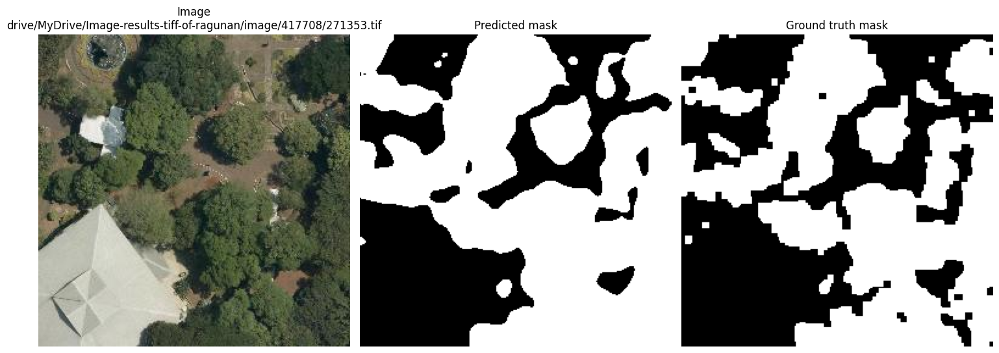

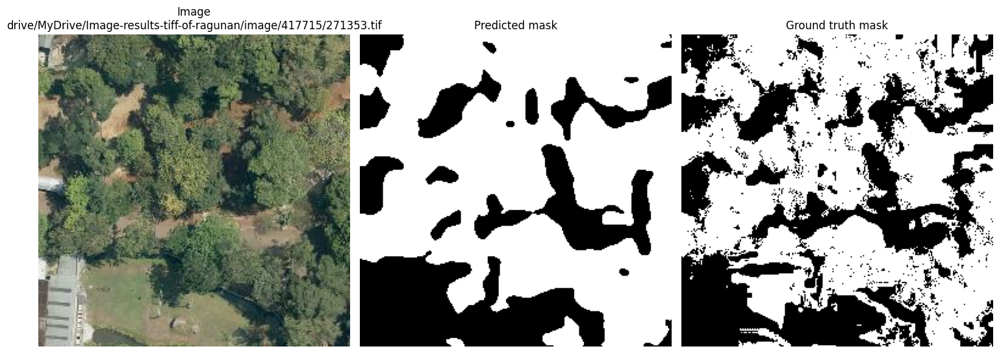

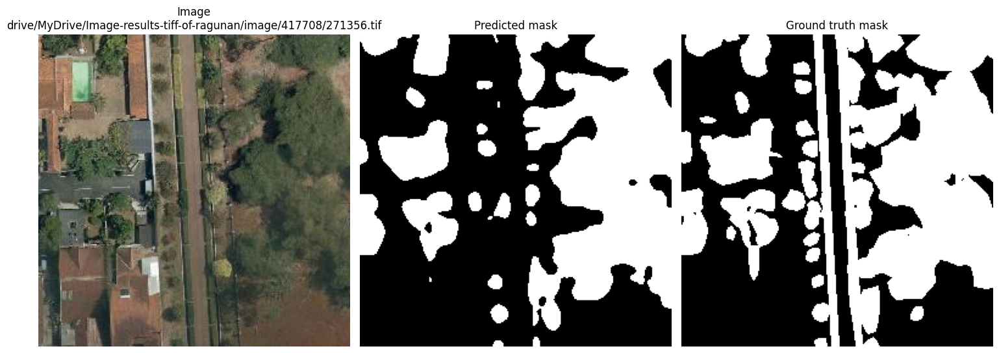

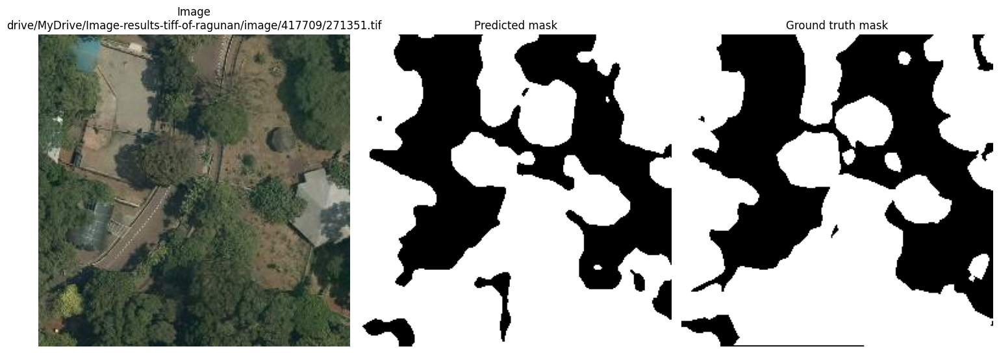

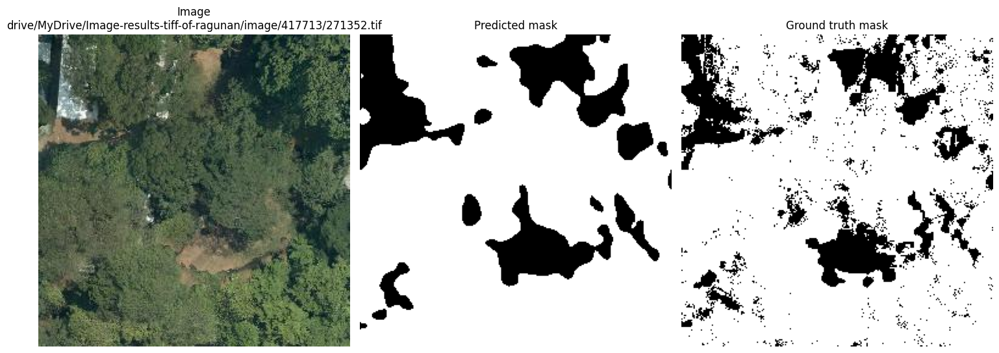

...

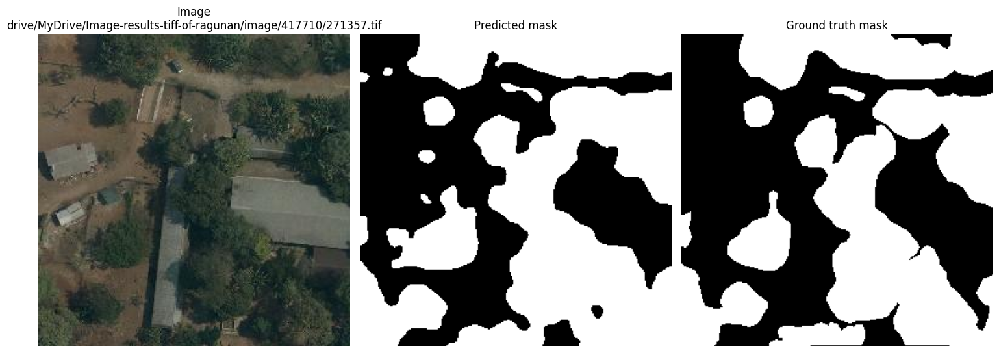

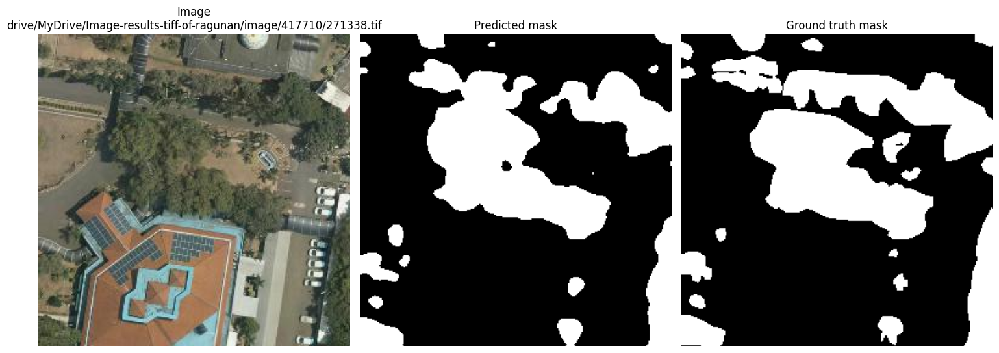

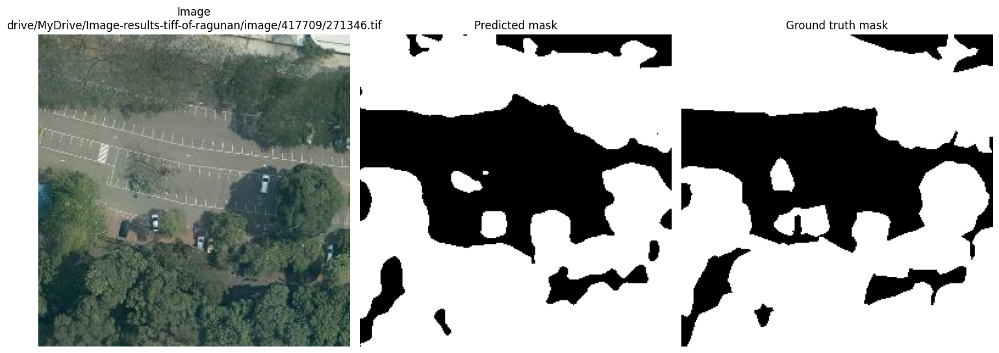

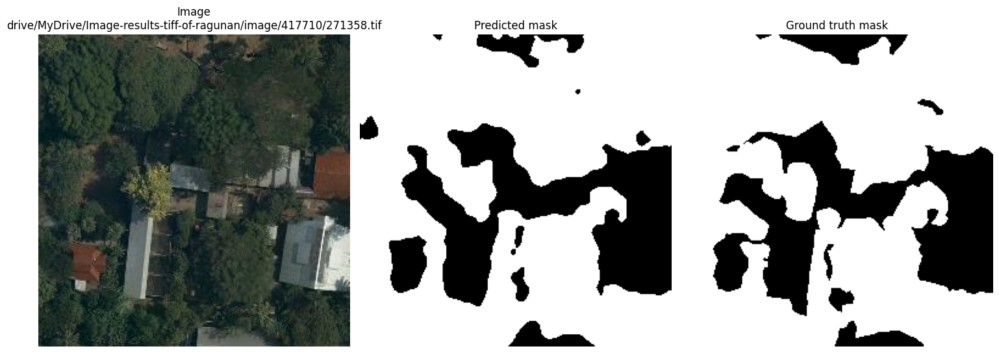

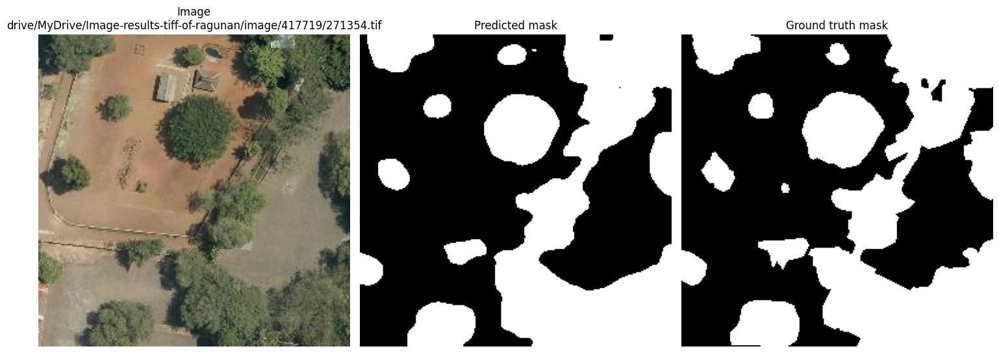

In [32]:
pred_masks = []
gt_masks = []
image_paths = []

with torch.no_grad():
    for image, mask, image_path, mask_path in test_loader:
        image = image.to(device)
        mask = mask.to(device)

        output = fine_tune_model(image)
        output = torch.sigmoid(output)
        pred_mask = (output > 0.5).float()

        for i in range(len(image_path)):
            img = image[i].cpu()
            img_path = image_path[i]

            if img.shape[0] == 1:
                img = img.squeeze(0).numpy()
            elif img.shape[0] == 3:
                img = img.permute(1, 2, 0).numpy()

            gt_mask = mask[i].cpu().squeeze().numpy()
            predicted_mask = pred_mask[i].cpu().squeeze().numpy()

            orig_image = Image.open(img_path).convert("RGB")
            orig_image = np.array(orig_image)

            gt_masks.append(gt_mask)
            pred_masks.append(predicted_mask)
            image_paths.append(img_path)

            plt.figure(figsize = (15, 8))
            plt.subplot(1, 3, 1)
            plt.imshow(orig_image)
            plt.axis("off")
            plt.title(f"Image\n{image_path[i]}")

            plt.subplot(1, 3, 2)
            plt.imshow(predicted_mask, cmap = "gray")
            plt.axis("off")
            plt.title("Predicted mask")

            plt.subplot(1, 3, 3)
            plt.imshow(gt_mask, cmap = "gray")
            plt.axis("off")
            plt.title("Ground truth mask")

            plt.tight_layout()
            plt.show()

In [33]:
def calculate_iou(pred_mask, gt_mask):
    pred_mask_bin = pred_mask > 0
    gt_mask_bin = gt_mask > 0

    intersection = np.logical_and(gt_mask_bin, pred_mask_bin).sum()
    union = np.logical_or(gt_mask_bin, pred_mask_bin).sum()

    if union == 0:
        return 1.0 if intersection == 0 else 0.0

    iou = intersection / union
    return iou

In [34]:
iou_scores = []
total_area = []
images_data = []

for i, img_path in enumerate(image_paths):
    pred_mask = (pred_masks[i] > 0.5).astype(np.uint8)
    gt_mask = (gt_masks[i] > 0.5).astype(np.uint8)

    with rasterio.open(img_path) as src:
        GSD_x, GSD_y = src.res

    pixels = np.sum(pred_mask == 1)
    veg_area = pixels * (GSD_x * GSD_y)
    iou_score = calculate_iou(pred_mask, gt_mask)

    iou_scores.append(iou_score)
    total_area.append(veg_area)

    images_data.append({
        "img_path": img_path,
        "veg_area": veg_area
    })

    print(f"Image {img_path}")
    print(f"GSD x: {GSD_x}")
    print(f"GSD y: {GSD_y}")
    print(f"Pixels: {pixels}")
    print(f"Vegetation coverage area: {veg_area}")
    print(f"IoU score: {iou_score}")
    print("=====================================================")

print("=====================================================")
print(f"Average IoU score: {np.mean(iou_scores)}")
print(f"Total vegetation coverage area: {np.sum(total_area)}")

Image drive/MyDrive/Image-results-tiff-of-ragunan/image/417708/271353.tif
GSD x: 1.9488129761920163
GSD y: 0.2888065298342284
Pixels: 40148
Vegetation coverage area: 22596.49534511383
IoU score: 0.8336783478732318
Image drive/MyDrive/Image-results-tiff-of-ragunan/image/417715/271353.tif
GSD x: 0.29544780320713926
GSD y: 0.263017456683479
Pixels: 44430
Vegetation coverage area: 3452.563320225935
IoU score: 0.7826031584309731
Image drive/MyDrive/Image-results-tiff-of-ragunan/image/417708/271356.tif
GSD x: 1.9488129761920163
GSD y: 0.2888065298342284
Pixels: 26522
Vegetation coverage area: 14927.37495125807
IoU score: 0.7288059967874353
Image drive/MyDrive/Image-results-tiff-of-ragunan/image/417709/271351.tif
GSD x: 1.9488129761920163
GSD y: 0.2888065298342284
Pixels: 40768
Vegetation coverage area: 22945.449891142787
IoU score: 0.8649172576832151
Image drive/MyDrive/Image-results-tiff-of-ragunan/image/417713/271352.tif
GSD x: 0.29544780320713926
GSD y: 0.263017456683479
Pixels: 52021
Veg

In [37]:
veg_areas = []
carbon_stocks = []

predicted_carbon = 1761.7253514097679

total_veg_area = sum(i["veg_area"] for i in images_data)
carbon_density = predicted_carbon / total_veg_area

for i in images_data:
    carbon_stock = i["veg_area"] * carbon_density
    veg_areas.append(i["veg_area"])
    carbon_stocks.append(carbon_stock)

    print(f"Image {i['img_path']}")
    print(f"Vegetation coverage area: {i['veg_area']} m^2")
    print(f"Carbon density: {carbon_density} ton/m^2")
    print(f"Estimated carbon stock: {carbon_stock} ton")
    print("================================================")

print("================================================")
print(f"Total vegetation coverage area: {total_veg_area} m^2")
print(f"Total carbon density: {carbon_density} ton/m^2")
print(f"Total estimated carbon stock: {sum(carbon_stocks)} ton")

Image drive/MyDrive/Image-results-tiff-of-ragunan/image/417708/271353.tif
Vegetation coverage area: 22596.49534511383 m^2
Carbon density: 0.007284051941893984 ton/m^2
Estimated carbon stock: 164.5940457985748 ton
Image drive/MyDrive/Image-results-tiff-of-ragunan/image/417715/271353.tif
Vegetation coverage area: 3452.563320225935 m^2
Carbon density: 0.007284051941893984 ton/m^2
Estimated carbon stock: 25.148650557203666 ton
Image drive/MyDrive/Image-results-tiff-of-ragunan/image/417708/271356.tif
Vegetation coverage area: 14927.37495125807 m^2
Carbon density: 0.007284051941893984 ton/m^2
Estimated carbon stock: 108.73177450109097 ton
Image drive/MyDrive/Image-results-tiff-of-ragunan/image/417709/271351.tif
Vegetation coverage area: 22945.449891142787 m^2
Carbon density: 0.007284051941893984 ton/m^2
Estimated carbon stock: 167.13584883720972 ton
Image drive/MyDrive/Image-results-tiff-of-ragunan/image/417713/271352.tif
Vegetation coverage area: 4042.444215203092 m^2
Carbon density: 0.0072